In [7]:
import os
import sys

def import_package(depth: int, is_jupyter: bool):
    if is_jupyter is False:
        current_dir = os.path.dirname(os.path.abspath(__file__))
    else:
        current_dir = os.getcwd()

    parent_dir = current_dir
    while depth > 0:
        depth -= 1
        parent_dir = os.path.dirname(parent_dir)
    print(current_dir)
    print(parent_dir)
    sys.path.insert(0, parent_dir)

import_package(1, True)

/Users/nguyenhuyhai/20212/blockchain_lab/HEALTH_TK/Indicator_correlation/Indicator/notebooks
/Users/nguyenhuyhai/20212/blockchain_lab/HEALTH_TK/Indicator_correlation/Indicator


In [8]:
from indicator import *
import pandas as pd
import matplotlib.pyplot as plt
from os import walk

In [3]:
def plot_ind(df, is_sma: bool, is_ema: bool, is_bband: bool, is_adx: bool, is_kdj: bool, is_mom: bool, is_rsi: bool, is_wma: bool, is_stck: bool, is_stcd: bool, begin: int, end: int, filename: str):
    ins_set = IndicatorSet()
    ins_set.insert_data_frame(df[begin:end], ["price_at_time"], timestamp_column="timestamp")

    # ins_set.insert_column(df["price_at_time"][:first], "price_at_time", False)
    # ins_set.insert_column(df["timestamp"][:first], "timestamp", True)
    
    ins_set.generate_ohlc("price_at_time", "15T")

    if is_sma:
        ins_set.insert_indicator(SMAIndicator(7), "sma7", ["close"], ["SMA 7"])
        ins_set.insert_indicator(SMAIndicator(25), "sma25", ["close"], ["SMA 25"])
        ins_set.insert_indicator(SMAIndicator(99), "sma99", ["close"], ["SMA 99"])

    if is_ema:
        ins_set.insert_indicator(EMAIndicator(7), "ema7", ["close"], ["EMA 7"])
        ins_set.insert_indicator(EMAIndicator(25), "ema25", ["close"], ["EMA 25"])
        ins_set.insert_indicator(EMAIndicator(99), "ema99", ["close"], ["EMA 99"])

    if is_bband:
        ins_set.insert_indicator(BBANDSIndicator(10), "bollingers", ["close"], ["bband upper", "bband middle", "bband lower"])

    if is_adx:
        ins_set.insert_indicator(ADXIndicator(14), "adx14", ["high", "low", "close"], ["ADX 14"])

    if is_kdj:
        ins_set.insert_indicator(KDJIndicator(), "kdj", ["high", "low", "close"], ["K", "D", "J"])

    if is_mom:
        ins_set.insert_indicator(MOMIndicator(7), "mom7", ["close"], ["MOM 7"])
        ins_set.insert_indicator(MOMIndicator(25), "mom25", ["close"], ["MOM 25"])
        ins_set.insert_indicator(MOMIndicator(99), "mom99", ["close"], ["MOM 99"])

    if is_wma:
        ins_set.insert_indicator(WMAIndicator(7), "wma7", ["close"], ["WMA 7"])
        ins_set.insert_indicator(WMAIndicator(25), "wma25", ["close"], ["WMA 25"])
        ins_set.insert_indicator(WMAIndicator(99), "wma99", ["close"], ["WMA 99"])

    if is_rsi:
        ins_set.insert_indicator(RSIIndicator(6), "rsi6", ["close"], ["RSI 6"])
        ins_set.insert_indicator(RSIIndicator(12), "rsi12", ["close"], ["RSI 12"])
        ins_set.insert_indicator(RSIIndicator(24), "rsi24", ["close"], ["RSI 24"])

    if is_stck:
        ins_set.insert_indicator(STCKIndicator(10), "stck10", ["high", "low", "close"], ["STCK 10"])

    if is_stcd:
        ins_set.insert_indicator(STCDIndicator(7), "stcd7", ["STCK 10"], ["STCD 7"]) # Đang còn nhập nhằng về timeperiod vì phụ thuộc timeperiod của stck


    ins_set.calculate()

    num_ind = sum([is_sma, is_ema, is_bband, is_adx, is_kdj, is_mom, is_rsi, is_wma, is_stck, is_stcd])
    if end is None:
        end = df.shape[0]

    fig = plt.figure(figsize=((end - begin) / 50, 3 * num_ind))
    axes = fig.subplots(num_ind, 1, sharex=True)

    if num_ind == 1:
        axes = [axes]

    num_ind = 0

    if is_sma:
        ins_set.plot(axes[num_ind], columns=["price_at_time"], names=["sma7", 'sma25', 'sma99'])
        num_ind += 1

    if is_ema:
        ins_set.plot(axes[num_ind], columns=["price_at_time"], names=["ema7", 'ema25', 'ema99'])
        num_ind += 1

    if is_bband:
        ins_set.plot(axes[num_ind], columns=["price_at_time"], names=['bollingers'])
        num_ind += 1

    if is_adx:
        ax = axes[num_ind]
        ins_set.plot(ax, names=["adx14"])
        ax.axhline(y = 50, color = 'r', linestyle = '-')
        ax.axhline(y = 25, color = 'r', linestyle = '-')
        num_ind += 1
        
    if is_kdj:
        ins_set.plot(axes[num_ind], names=['kdj'])
        num_ind += 1

    if is_mom:
        ins_set.plot(axes[num_ind], names=["mom7", 'mom25', 'mom99'])
        num_ind += 1

    if is_rsi:
        ins_set.plot(axes[num_ind], names=["rsi6", 'rsi12', 'rsi24'])
        num_ind += 1

    if is_wma:
        ins_set.plot(axes[num_ind], columns=["price_at_time"], names=["wma7", 'wma25', 'wma99'])
        num_ind += 1

    if is_stck:
        ins_set.plot(axes[num_ind], names=["stck10"])
        num_ind += 1

    if is_stcd:
        ins_set.plot(axes[num_ind], names=["stcd7"])
        num_ind += 1




    fig.suptitle(filename, fontsize=16)
    fig.tight_layout()
    plt.show()

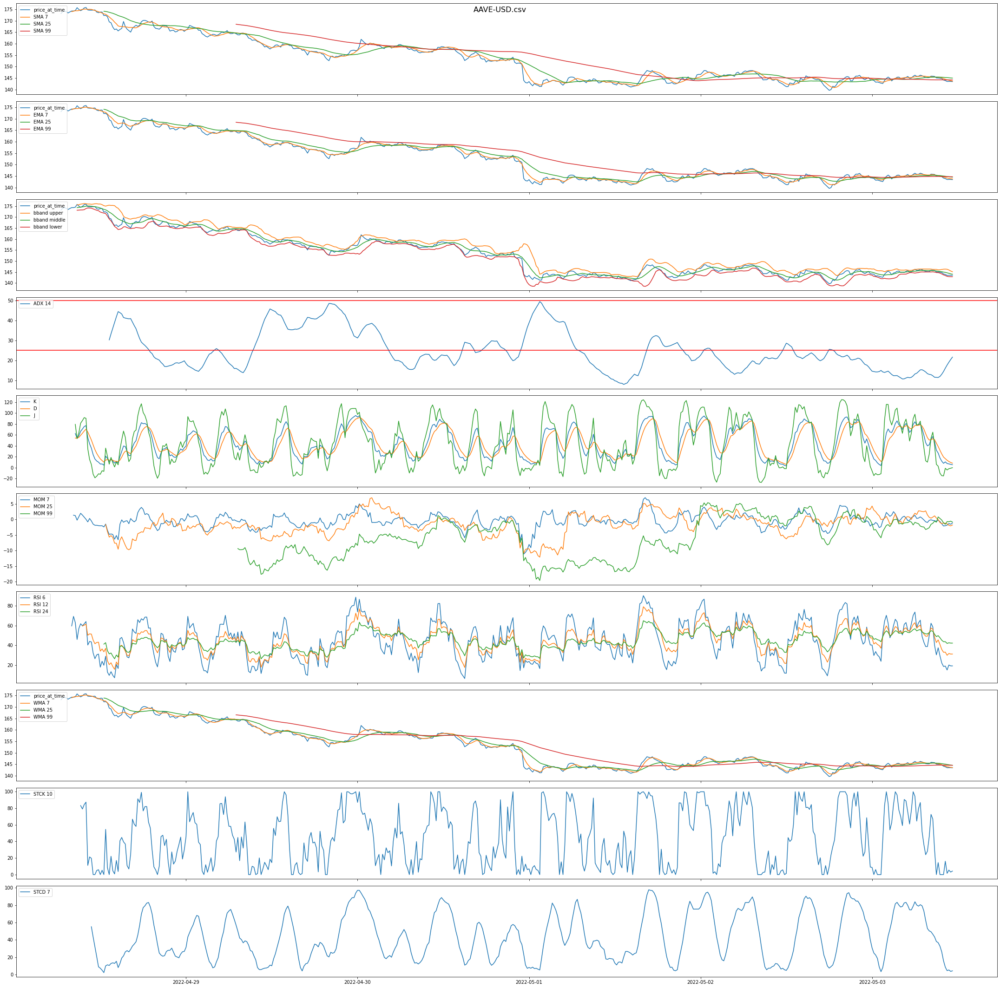

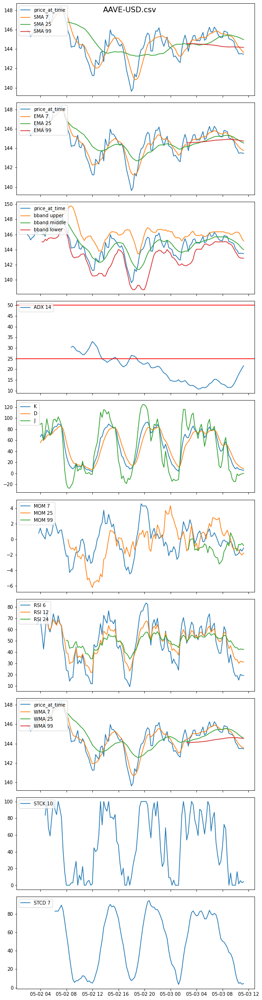

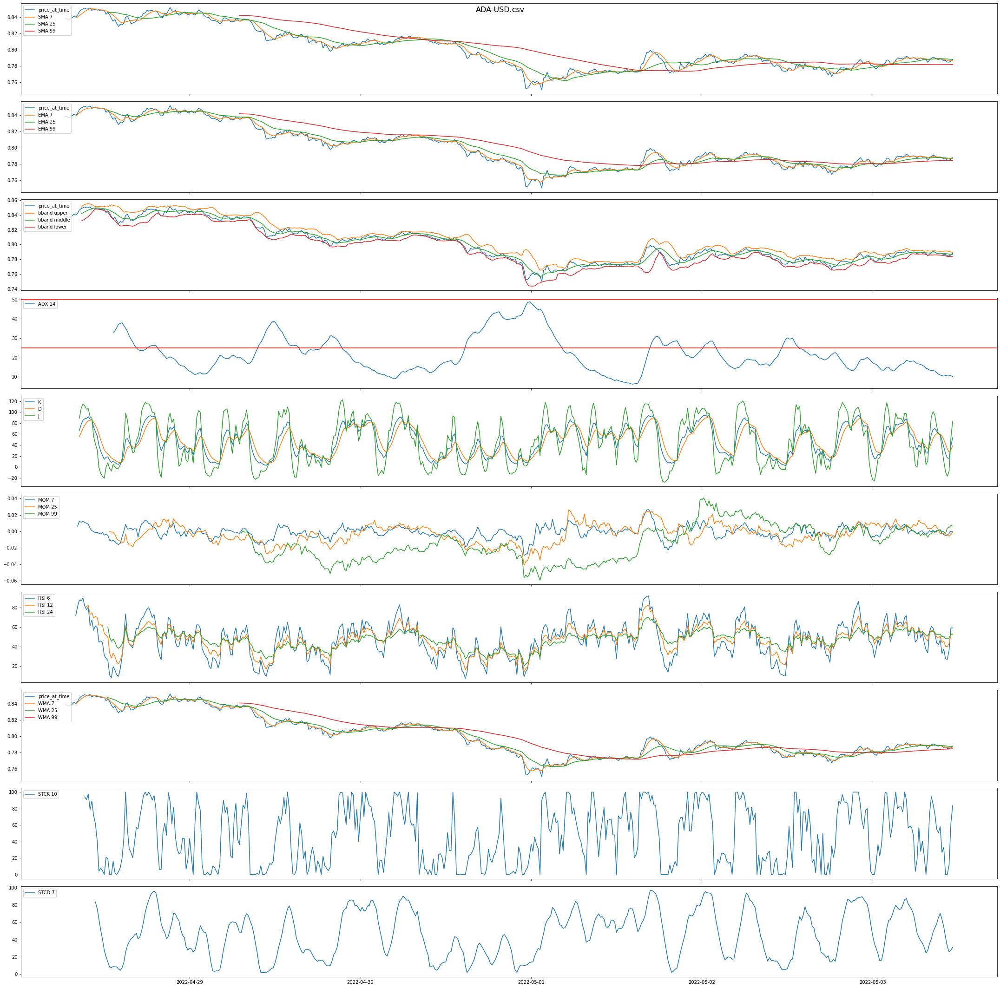

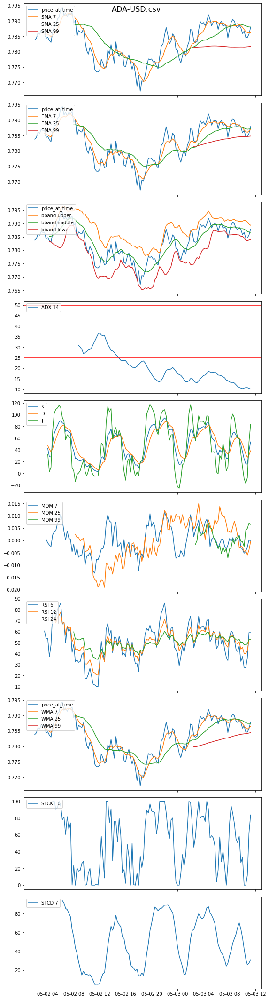

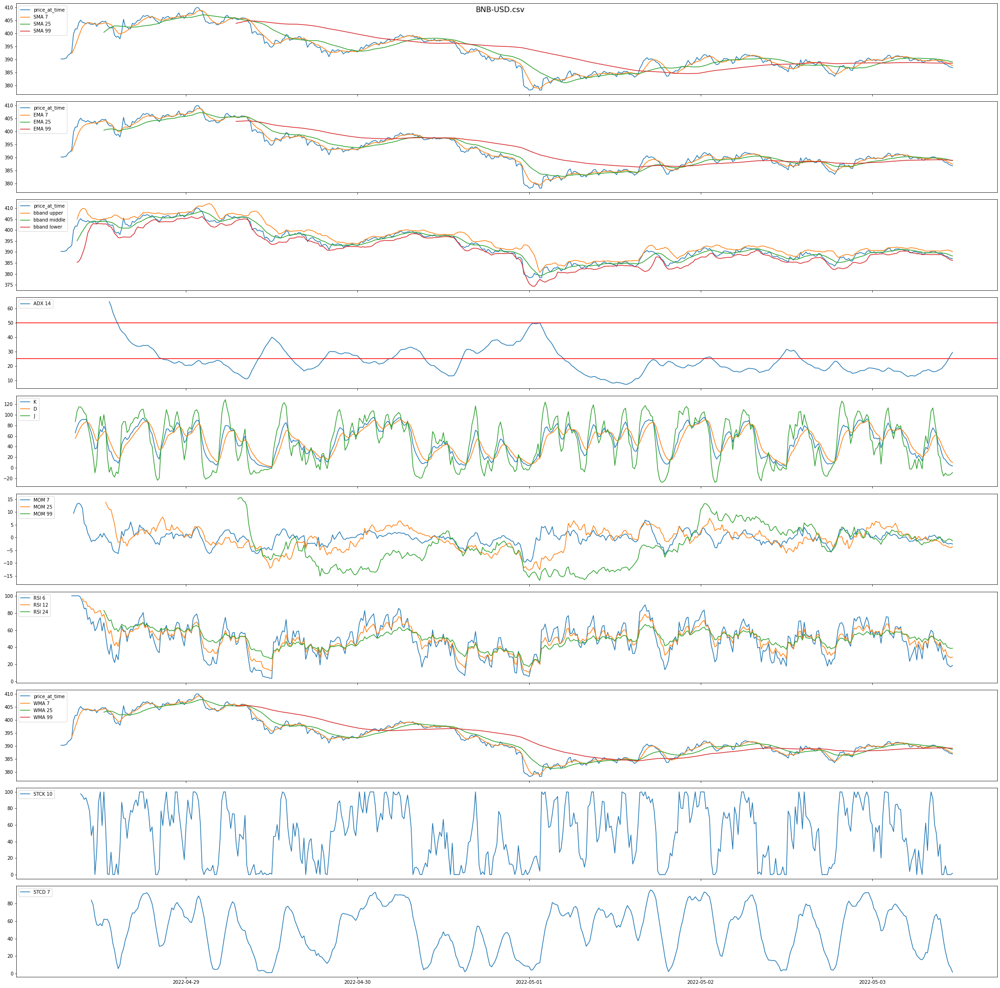

...

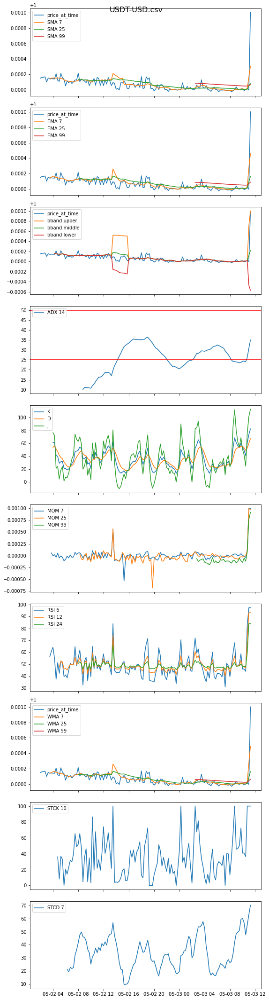

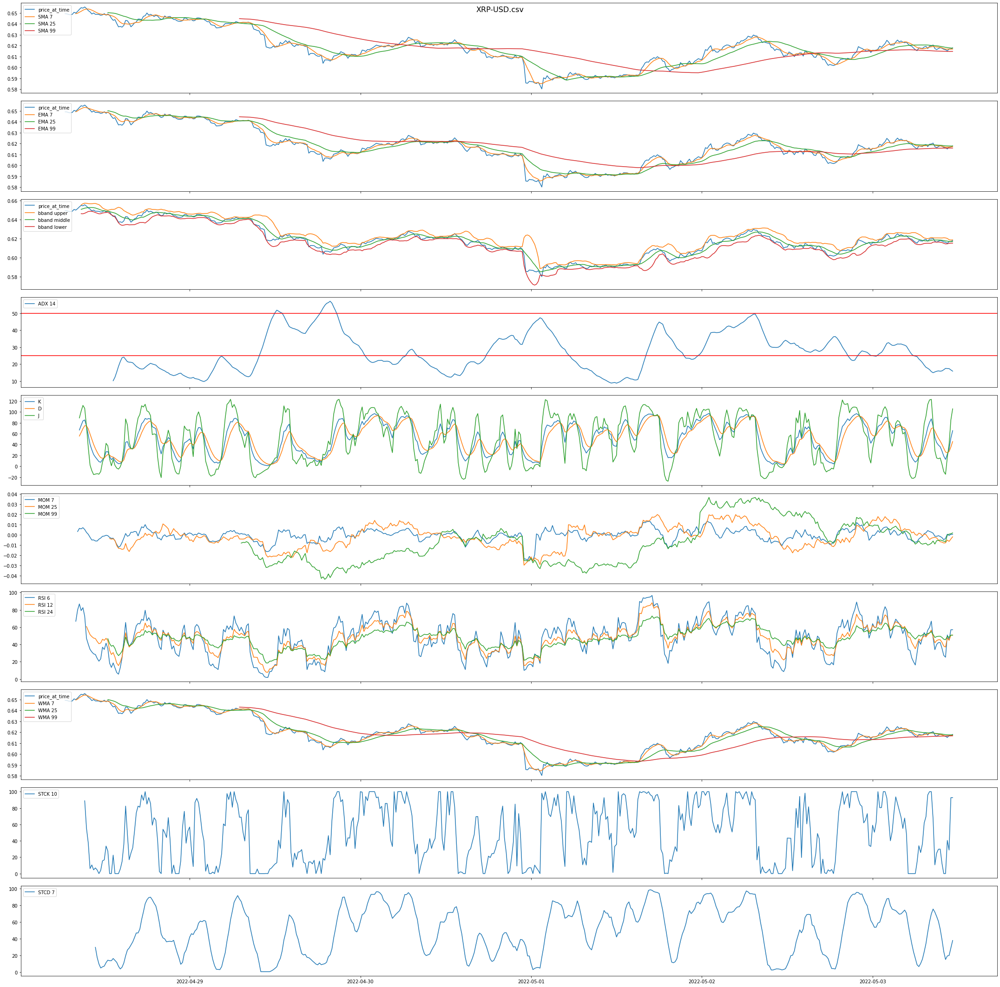

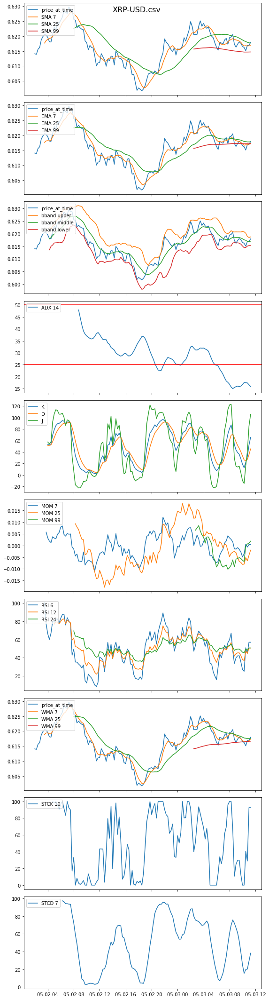

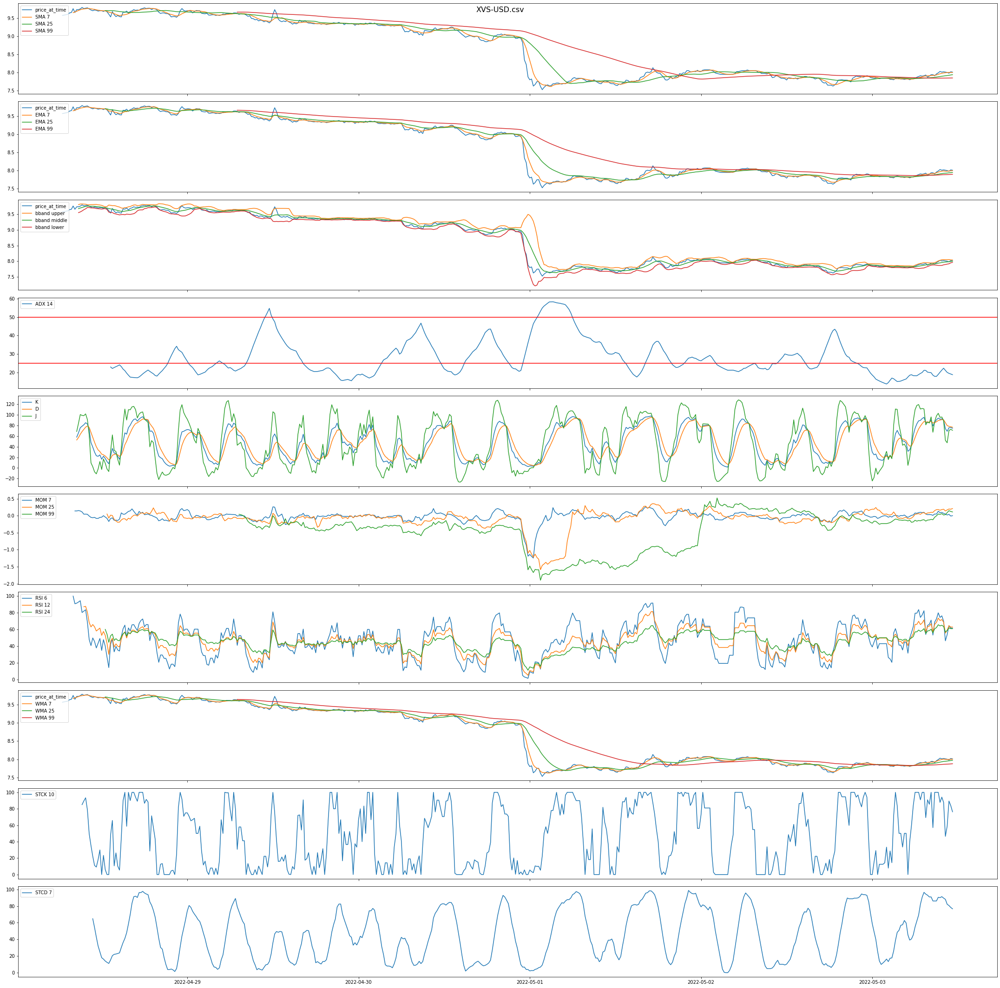

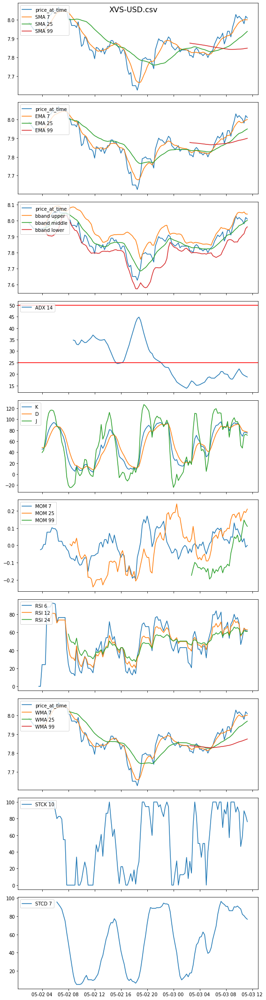

In [4]:
(_, _, filenames) = next(walk("D:/Savage/bkc/Indicator/data"), (None, None, [])) # Change path

for file in filenames:
    df = pd.read_csv(f'../data/{file}')
    plot_ind(df, True, True, True, True, True, True, True, True, True, True, True, len(df) - 1500, len(df), file) # 1500 last data points
    plot_ind(df, True, True, True, True, True, True, True, True, True, True, True, len(df) - 400, len(df), file) # 400 last data points